# Dog Breed Image Classification using AWS SageMaker

Welcome to the Image Classification using AWS SageMaker project, which is a part of the AWS Machine Learning Engineer Nanodegree program. In this project, I will be using a pre-trained Resnet50 model from the PyTorch vision library and fine-tuning it with hyperparameter tuning and network re-shaping. Additionally, I will be implementing profiling and debugging with hooks to optimize our model's performance. Finally, I will deploy the model and perform inference. This project will provide me with a hands-on experience of using SageMaker to build and deploy a custom image classification model.


In [1]:
# Install packages
!pip install smdebug

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.1/270.1 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.3/83.3 kB 14.0 MB/s eta 0:00:00


In [2]:
# Import requeried packages
import sagemaker
import boto3
from sagemaker.session import Session
from sagemaker import get_execution_role

#Importing all the required modules fomr tuner
from sagemaker.tuner import (
    CategoricalParameter,
    ContinuousParameter,
    HyperparameterTuner
)

from  sagemaker.pytorch import PyTorch

In [3]:
# Setup main configuration  
role = get_execution_role()
sagemaker_session = sagemaker.Session()
region = sagemaker_session.boto_region_name
bucket = sagemaker_session.default_bucket()
print(f"Region is: {region}")
print(f"Default s3 bucket : {bucket}")
print(f"the Role is : {bucket}")

Region is: us-east-1
Default s3 bucket : sagemaker-us-east-1-440031016051
the Role is : sagemaker-us-east-1-440031016051


## Dataset
The project utilizes the Dog Classification Dataset from Udacity for image classification. The dataset can be obtained by following the (link) [https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip] provided here.

In [4]:
# Fetch and upload the data to AWS S3
# Command to download and unzip data
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip

--2023-04-20 12:56:56--  https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.192.72
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.192.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1132023110 (1.1G) [application/zip]
Saving to: ‘dogImages.zip’

100%[====================================>] 1,132,023,110 46.4MB/s   in 24s    

2023-04-20 12:57:20 (45.2 MB/s) - ‘dogImages.zip’ saved [1132023110/1132023110]



In [5]:
# unzip the dataset
!unzip dogImages.zip

Archive:  dogImages.zip
   creating: dogImages/
   creating: dogImages/test/
   creating: dogImages/train/
   creating: dogImages/valid/
   creating: dogImages/test/001.Affenpinscher/
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00003.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00023.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00036.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00047.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00048.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00058.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00071.jpg  
  inflating: dogImages/test/001.Affenpinscher/Affenpinscher_00078.jpg  
   creating: dogImages/test/002.Afghan_hound/
  inflating: dogImages/test/002.Afghan_hound/Afghan_hound_00116.jpg  
  inflating: dogImages/test/002.Afghan_hound/Afghan_hound_00125.jpg  
  inflating: dogImages/test/002.Afghan_hound/Afghan_ho

In [9]:
# upload the datast to s3 bucket
prefix ="dogImagesDataset"
print("Starting to uploading dogImages")
input_path = sagemaker_session.upload_data(path="dogImages", bucket=bucket, key_prefix=prefix)
print(f"Input S3 path ( S3 file path ): {input_path}")

Starting to uploading dogImages
Input S3 path ( S3 file path ): s3://sagemaker-us-east-1-440031016051/dogImagesDataset


In [ ]:
input_path = "s3://sagemaker-us-east-1-440031016051/dogImagesDataset"

## Hyperparameter Tuning
The image classification task is performed using the ResNet model, which employs the deep Residual Learning Framework to simplify the training process. Two fully connected neural networks are added to the top of the pre-trained model to carry out the classification task, with 133 output nodes.

To optimize the model, AdamW from the torch.optim package is utilized as the optimizer. The following hyperparameters are tuned using the hpo.py script:

- Learning rate: 0.01x to 100x
- Epsilon (eps): 1e-09 to 1e-08
- Weight decay: 0.1x to 10x
- Batch size: 64 or 128 <br>
The hyperparameter tuning is carried out to find the best combination of hyperparameters that maximizes the model's performance.


In [10]:
#In this project, we are using AdamW as an optimizer, which is known to use a better approach to calculate the weight decay-related computations. 
#Therefore, we will also tune the weight_decay and eps hyperparameters along with the learning rate and batch size params.

hyperparameter_ranges = {
    "lr": ContinuousParameter(0.0001, 0.1),
    "eps": ContinuousParameter(1e-9, 1e-8),
    "weight_decay": ContinuousParameter(1e-3, 1e-1),
    "batch_size": CategoricalParameter([ 64, 128]),
}
objective_metric_name = "average test loss"
objective_type = "Minimize"
metric_definitions = [{"Name": "average test loss", "Regex": "Test set: Average loss: ([0-9\\.]+)"}]

In [15]:
# Build the estimator
estimator = PyTorch(
    entry_point = "hpo.py",
    base_job_name = "hpo-dog-breed-classification",
    role = role,
    instance_count = 1,
    instance_type = "ml.p3.2xlarge",
    py_version = "py36",
    framework_version = "1.8"
)

# set tuner
tuner = HyperparameterTuner(
    estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=4,
    max_parallel_jobs=1,
    objective_type=objective_type, 
    early_stopping_type="Auto"
)

In [16]:
tuner.fit({"training": input_path }, wait=True)

No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config
No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config


......................................................................................................................................................................................................................................................................................................................!


In [17]:
# Get the best estimators and the best HPs

best_estimator = tuner.best_estimator()

#Get the hyperparameters of the best trained model
best_estimator.hyperparameters()


2023-04-20 13:35:16 Starting - Found matching resource for reuse
2023-04-20 13:35:16 Downloading - Downloading input data
2023-04-20 13:35:16 Training - Training image download completed. Training in progress.
2023-04-20 13:35:16 Uploading - Uploading generated training model
2023-04-20 13:35:16 Completed - Resource reused by training job: pytorch-training-230420-1317-003-d8c53ac9


{'_tuning_objective_metric': '"average test loss"',
 'batch_size': '"64"',
 'eps': '7.194106923810662e-09',
 'lr': '0.00046888652781937914',
 'sagemaker_container_log_level': '20',
 'sagemaker_estimator_class_name': '"PyTorch"',
 'sagemaker_estimator_module': '"sagemaker.pytorch.estimator"',
 'sagemaker_job_name': '"hpo-dog-breed-classification-2023-04-20-13-17-31-974"',
 'sagemaker_program': '"hpo.py"',
 'sagemaker_region': '"us-east-1"',
 'sagemaker_submit_directory': '"s3://sagemaker-us-east-1-440031016051/hpo-dog-breed-classification-2023-04-20-13-17-31-974/source/sourcedir.tar.gz"',
 'weight_decay': '0.017341047743009572'}

In [18]:
best_hyperparameters={'batch_size': int(best_estimator.hyperparameters()['batch_size'].replace('"', "")),
                      'eps': best_estimator.hyperparameters()['eps'],
                      'lr': best_estimator.hyperparameters()['lr'],
                      'weight_decay': best_estimator.hyperparameters()['weight_decay'],}
print(f"Best Hyperparamters post Hyperparameter fine tuning are : \n {best_hyperparameters}")

Best Hyperparamters post Hyperparameter fine tuning are : 
 {'batch_size': 64, 'eps': '7.194106923810662e-09', 'lr': '0.00046888652781937914', 'weight_decay': '0.017341047743009572'}


## Model Profiling and Debugging
The hyperparameters obtained above is used to finetune the model

The `train_model.py` script is used to perform model profiling and debugging.

In [19]:
# Setting up debugger and profiler rules and configs
from sagemaker.debugger import (
    Rule,
    rule_configs, 
    ProfilerRule,
    DebuggerHookConfig,
    CollectionConfig,
    ProfilerConfig,
    FrameworkProfile
)


rules = [
    Rule.sagemaker(rule_configs.vanishing_gradient()),
    Rule.sagemaker(rule_configs.overfit()),
    Rule.sagemaker(rule_configs.overtraining()),
    Rule.sagemaker(rule_configs.poor_weight_initialization()),
    ProfilerRule.sagemaker(rule_configs.ProfilerReport()),
]

profiler_config = ProfilerConfig(
    system_monitor_interval_millis=500, framework_profile_params=FrameworkProfile(num_steps=10)
)

collection_configs=[CollectionConfig(name="CrossEntropyLoss_output_0",parameters={
    "include_regex": "CrossEntropyLoss_output_0", "train.save_interval": "10","eval.save_interval": "1"})]

debugger_config=DebuggerHookConfig( collection_configs=collection_configs )

In [20]:
# Create and fit an estimator
estimator = PyTorch(
    entry_point="train_model.py",
    instance_count=1,
    instance_type="ml.p3.2xlarge",
    role=role,
    framework_version="1.6", #using 1.6 as it has support for smdebug lib , https://github.com/awslabs/sagemaker-debugger#debugger-supported-frameworks
    py_version="py36",
    hyperparameters=best_hyperparameters,
    profiler_config=profiler_config, # include the profiler hook
    debugger_hook_config=debugger_config, # include the debugger hook
    rules=rules
)

estimator.fit({'train' : input_path },wait=True)

INFO:sagemaker.image_uris:image_uri is not presented, retrieving image_uri based on instance_type, framework etc.
INFO:sagemaker:Creating training-job with name: pytorch-training-2023-04-20-13-45-28-402


2023-04-20 13:45:29 Starting - Starting the training job...
2023-04-20 13:45:56 Starting - Preparing the instances for trainingVanishingGradient: InProgress
Overfit: InProgress
Overtraining: InProgress
PoorWeightInitialization: InProgress
ProfilerReport: InProgress
.........
2023-04-20 13:47:22 Downloading - Downloading input data...
2023-04-20 13:47:57 Training - Downloading the training image......
2023-04-20 13:48:58 Training - Training image download completed. Training in progress....bash: cannot set terminal process group (-1): Inappropriate ioctl for device
bash: no job control in this shell
2023-04-20 13:49:19,204 sagemaker-training-toolkit INFO     Imported framework sagemaker_pytorch_container.training
2023-04-20 13:49:19,237 sagemaker_pytorch_container.training INFO     Block until all host DNS lookups succeed.
2023-04-20 13:49:19,239 sagemaker_pytorch_container.training INFO     Invoking user training script.
2023-04-20 13:49:19,517 sagemaker-training-toolkit INFO     Invok

In [21]:
#fetching jobname , client and description to be used for plotting.
job_name = estimator.latest_training_job.name
client = estimator.sagemaker_session.sagemaker_client
description = client.describe_training_job(TrainingJobName=estimator.latest_training_job.name)
print(f"Jobname: {job_name}")
print(f"Client: {client}")
print(f"Description: {description}")

Jobname: pytorch-training-2023-04-20-13-45-28-402
Client: <botocore.client.SageMaker object at 0x7f084d26c1c0>
Description: {'TrainingJobName': 'pytorch-training-2023-04-20-13-45-28-402', 'TrainingJobArn': 'arn:aws:sagemaker:us-east-1:440031016051:training-job/pytorch-training-2023-04-20-13-45-28-402', 'ModelArtifacts': {'S3ModelArtifacts': 's3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/output/model.tar.gz'}, 'TrainingJobStatus': 'Completed', 'SecondaryStatus': 'Completed', 'HyperParameters': {'batch_size': '64', 'eps': '"7.194106923810662e-09"', 'lr': '"0.00046888652781937914"', 'sagemaker_container_log_level': '20', 'sagemaker_job_name': '"pytorch-training-2023-04-20-13-45-28-402"', 'sagemaker_program': '"train_model.py"', 'sagemaker_region': '"us-east-1"', 'sagemaker_submit_directory': '"s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/source/sourcedir.tar.gz"', 'weight_decay': '"0.017341047743009572"'}, 'AlgorithmSpecif

In [22]:
# Define a Trail

from smdebug.trials import create_trial
from smdebug.core.modes import ModeKeys

trial = create_trial(estimator.latest_job_debugger_artifacts_path())

[2023-04-20 13:56:31.038 ip-172-16-11-157.ec2.internal:8721 INFO utils.py:27] RULE_JOB_STOP_SIGNAL_FILENAME: None
[2023-04-20 13:56:31.071 ip-172-16-11-157.ec2.internal:8721 INFO s3_trial.py:42] Loading trial debug-output at path s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/debug-output


INFO:botocore.credentials:Found credentials from IAM Role: BaseNotebookInstanceEc2InstanceRole


INFO:matplotlib.font_manager:generated new fontManager


[2023-04-20 13:56:48.568 ip-172-16-11-157.ec2.internal:8721 INFO trial.py:197] Training has ended, will refresh one final time in 1 sec.
[2023-04-20 13:56:49.592 ip-172-16-11-157.ec2.internal:8721 INFO trial.py:210] Loaded all steps
loaded TRAIN data
loaded EVAL data
Completed TRAIN plot
Completed EVAL plot


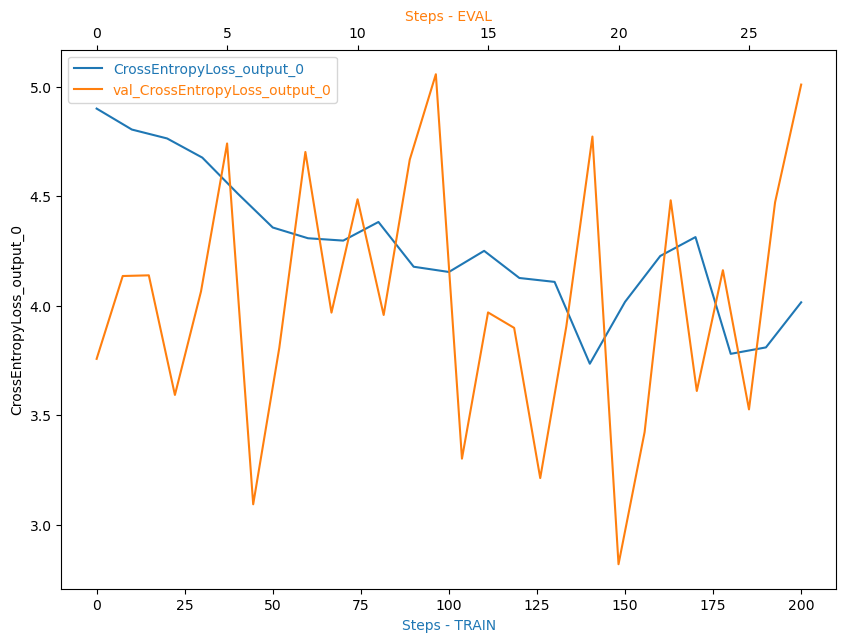

In [23]:
# TODO: Plot a debugging output.
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import host_subplot

#utility function to get data from tensors
def get_data(trial, tname, mode):
    tensor = trial.tensor(tname)
    steps = tensor.steps(mode=mode)
    vals = []
    for s in steps:
        vals.append(tensor.value(s, mode=mode))
    return steps, vals

#plot tensor utility functions for plotting tensors
def plot_tensor(trial, tensor_name):

    steps_train, vals_train = get_data(trial, tensor_name, mode=ModeKeys.TRAIN)
    print("loaded TRAIN data")
    steps_eval, vals_eval = get_data(trial, tensor_name, mode=ModeKeys.EVAL)
    print("loaded EVAL data")

    fig = plt.figure(figsize=(10, 7))
    host = host_subplot(111)

    par = host.twiny()

    host.set_xlabel("Steps - TRAIN")
    par.set_xlabel("Steps - EVAL")
    host.set_ylabel(tensor_name)

    (p1,) = host.plot(steps_train, vals_train, label=tensor_name)
    print("Completed TRAIN plot")
    (p2,) = par.plot(steps_eval, vals_eval, label="val_" + tensor_name)
    print("Completed EVAL plot")
    leg = plt.legend()

    host.xaxis.get_label().set_color(p1.get_color())
    leg.texts[0].set_color(p1.get_color())

    par.xaxis.get_label().set_color(p2.get_color())
    leg.texts[1].set_color(p2.get_color())

    plt.ylabel(tensor_name)
    plt.show()
plot_tensor(trial, "CrossEntropyLoss_output_0")

If the debugging output shows fluctuations and inconsistencies between batches, it may indicate a lack of convergence or overfitting. In such cases, regularization techniques such as dropout or weight decay could be applied to prevent overfitting. Alternatively, the batch shuffling technique can be used to ensure that the training data is presented in a random order for each epoch, preventing the model from memorizing the training data's order. Additionally, trying out different neural network architectures, such as increasing the number of layers or changing the activation functions, could also improve model performance.

In [24]:
# TODO: Display the profiler output
rule_output_path = estimator.output_path + estimator.latest_training_job.job_name + "/rule-output"
print(f"Profiler report location: {rule_output_path}")

Profiler report location: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/rule-output


In [25]:
! aws s3 ls {rule_output_path} --recursive

2023-04-20 13:54:07     380397 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-report.html
2023-04-20 13:54:06     229540 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-report.ipynb
2023-04-20 13:54:01        191 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/BatchSize.json
2023-04-20 13:54:01      11692 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/CPUBottleneck.json
2023-04-20 13:54:01        126 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/Dataloader.json
2023-04-20 13:54:01        129 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/GPUMemoryIncrease.json
2023-04-20 13:54:01        784 pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-re

In [26]:
! aws s3 cp {rule_output_path} ./ --recursive

download: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/BatchSize.json to ProfilerReport/profiler-output/profiler-reports/BatchSize.json
download: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-report.ipynb to ProfilerReport/profiler-output/profiler-report.ipynb
download: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/CPUBottleneck.json to ProfilerReport/profiler-output/profiler-reports/CPUBottleneck.json
download: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28-402/rule-output/ProfilerReport/profiler-output/profiler-reports/LoadBalancing.json to ProfilerReport/profiler-output/profiler-reports/LoadBalancing.json
download: s3://sagemaker-us-east-1-440031016051/pytorch-training-2023-04-20-13-45-28

In [27]:
import os

# get the autogenerated folder name of profiler report
profiler_report_name = [
    rule["RuleConfigurationName"]
    for rule in estimator.latest_training_job.rule_job_summary()
    if "Profiler" in rule["RuleConfigurationName"]
][0]

In [28]:
import IPython

IPython.display.HTML(filename=profiler_report_name + "/profiler-output/profiler-report.html")

In [29]:
# Zipping the ProfilerReport inorder to export and upload it later for submission
import shutil
shutil.make_archive("./profiler_repot.zip", "zip", "ProfilerReport")

'/home/ec2-user/SageMaker/profiler_repot.zip.zip'

## Model Deploying

In [30]:
# Deploy your model to an endpoint

predictor = estimator.deploy(initial_instance_count=1, instance_type="ml.m5.xlarge")

INFO:sagemaker:Creating model with name: pytorch-training-2023-04-20-14-00-47-387
INFO:sagemaker:Creating endpoint-config with name pytorch-training-2023-04-20-14-00-47-387
INFO:sagemaker:Creating endpoint with name pytorch-training-2023-04-20-14-00-47-387


-----!

In [31]:
from sagemaker.pytorch import PyTorchModel
from sagemaker.predictor import Predictor

#Below is the s3 location of our saved model that was trained by the training job using the best hyperparameters
model_data_artifacts = "s3://sagemaker-us-east-1-440031016051/pytorch-training-230420-1317-004-5363d974/output/model.tar.gz"

#We need to define the serializer and deserializer that we will be using as default for our Prediction purposes
jpeg_serializer = sagemaker.serializers.IdentitySerializer("image/jpeg")
json_deserializer = sagemaker.deserializers.JSONDeserializer()

#If we need to override the serializer and deserializer then we need to pass them in an class inheriting the Predictor class and pass this class as parameter to our PyTorchModel
class ImgPredictor(Predictor):
    def __init__( self, endpoint_name, sagemaker_session):
        super( ImgPredictor, self).__init__(
            endpoint_name,
            sagemaker_session = sagemaker_session,
            serializer = jpeg_serializer,
            deserializer = json_deserializer
        )
        
pytorch_model = PyTorchModel( model_data = model_data_artifacts,
                            role = role,
                             entry_point= "endpoint_inference.py",
                             py_version = "py36",
                             framework_version = "1.6",
                            predictor_cls = ImgPredictor
                            )

predictor = pytorch_model.deploy( initial_instance_count = 1, instance_type = "ml.t2.medium")

INFO:sagemaker:Creating model with name: pytorch-inference-2023-04-20-14-06-19-012
INFO:sagemaker:Creating endpoint-config with name pytorch-inference-2023-04-20-14-06-19-856
INFO:sagemaker:Creating endpoint with name pytorch-inference-2023-04-20-14-06-19-856


------------!

Test image no: 1
Below is the image that we will be testing:


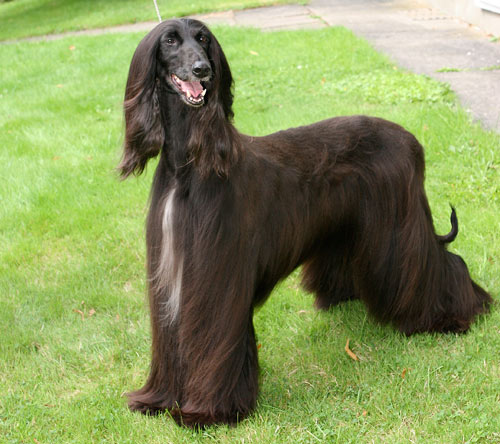

Expected dog breed category no : 2
Response: [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.503145694732666, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7878490090370178, 0.0, 0.2309587299823761, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1495341807603836, 0.0, 0.0, 0.0, 0.0, 1.0827394723892212, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
Response/Inference for the above image is : [21]
Test image no: 2
Below is the image that we will be testing:


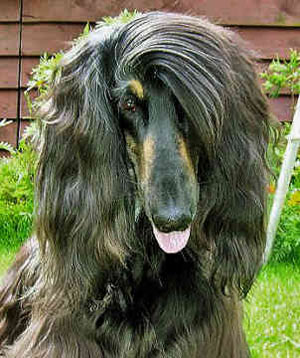

Expected dog breed category no : 2
Response: [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6951552033424377, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.24915720522403717, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.301241397857666, 0.0, 0.24667665362358093, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3080439567565918, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6661750674247742, 0.0, 0.0, 0.0, 0.0]]
Response/Inference for the above image is : [54]
Test image no: 3
Below is the image that we will be testing:


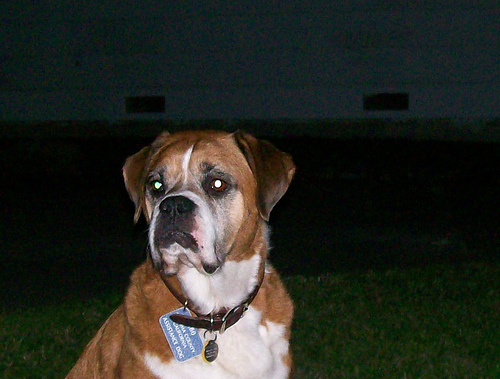

Expected dog breed category no : 34
Response: [[0.0, 0.0, 0.0, 0.6449073553085327, 0.0, 0.0, 0.0, 3.46658992767334, 0.0, 0.7400771379470825, 0.0, 0.0, 0.0, 1.5393955707550049, 0.0, 0.6542568206787109, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.35881760716438293, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0998803973197937, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0384770631790161, 0.0, 0.0, 0.6195851564407349, 0.0, 0.0, 0.0, 1.9824376106262207, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.462984323501587, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
Response/Inference for the above image is : [8]
Test image no: 4
Below is the image that we will be testing:


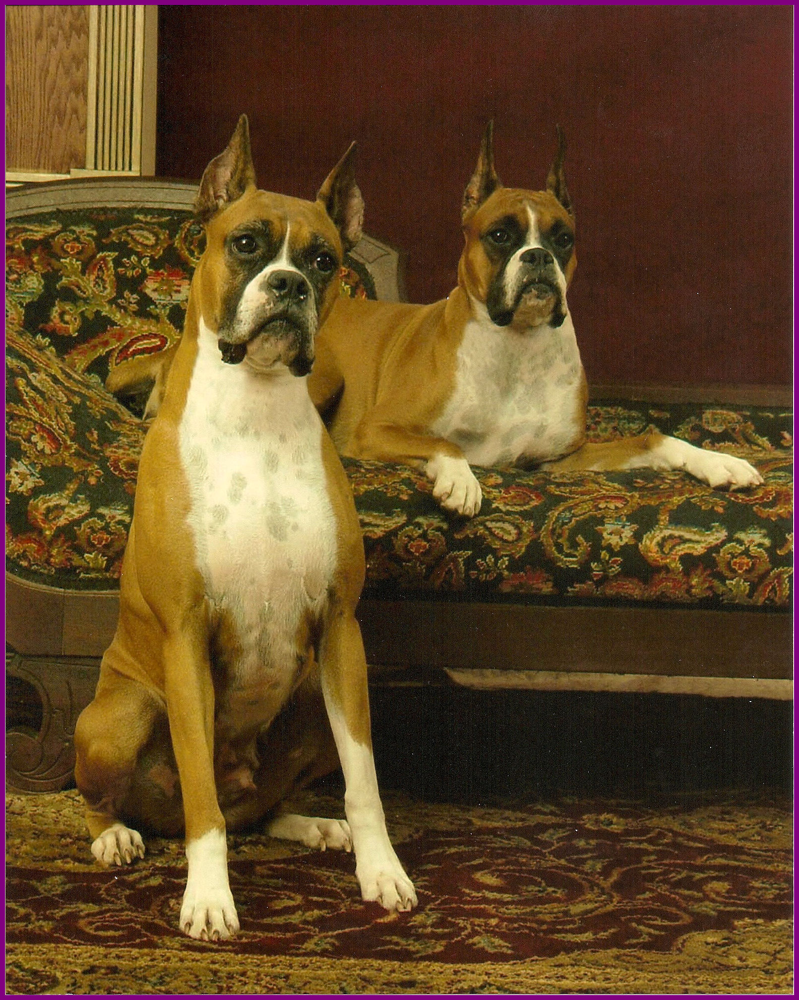

Expected dog breed category no : 34
Response: [[0.0, 0.0, 0.0, 0.8895069360733032, 0.0, 0.0, 0.0, 3.1671528816223145, 0.0, 0.0, 0.0, 0.0, 0.0, 3.6263132095336914, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.21652163565158844, 0.0, 0.0, 0.0, 0.0, 2.5511670112609863, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.2113511562347412, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.3753465414047241, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.15022850036621094, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
Response/Inference for the above image is : [14]


In [34]:
#Testing the deployed endpoint using some test images
#Solution 1: Using the Predictor object directly.
from PIL import Image
import io
import os
import numpy as np

test_dir = "./test_image"
test_images = [ "Afghan_hound_00106.jpg", 'Afghan_hound_00115.jpg', 'Boxer_02369.jpg','Boxer_02437.jpg' ]
test_images_expected_output = [2, 2, 34,34]
for index in range(len(test_images) ):
    test_img = test_images[index]
    expected_breed_category = test_images_expected_output[index]
    print(f"Test image no: {index+1}")
    test_file_path = os.path.join(test_dir,test_img)
    with open(test_file_path , "rb") as f:
        payload = f.read()
        print("Below is the image that we will be testing:")
        display(Image.open(io.BytesIO(payload)))
        print(f"Expected dog breed category no : {expected_breed_category}")
        response = predictor.predict(payload, initial_args={"ContentType": "image/jpeg"})
        print(f"Response: {response}")
        predicted_dog_breed = np.argmax(response,1) + 1 #We need to do plus 1 as index starts from zero and prediction is zero-indexed
        print(f"Response/Inference for the above image is : {predicted_dog_breed}")

In [35]:
print(predictor.endpoint_name)
endpoint_name = predictor.endpoint_name

pytorch-inference-2023-04-20-14-06-19-856


In [36]:
# Remember to shutdown/delete your endpoint once your work is done
predictor.delete_endpoint()

INFO:sagemaker:Deleting endpoint configuration with name: pytorch-inference-2023-04-20-14-06-19-856
INFO:sagemaker:Deleting endpoint with name: pytorch-inference-2023-04-20-14-06-19-856
